<b> Aim: to categorise the countries using socio-economic and health factors that determine the overall development of the country </b>
<br> Which countries do charities need to focus on the most? 

<b> notes </b>
<br> country = name of the country 
<br> child_mort = death of children under 5 years of age per 1000 live births 
<br> exports = exports of good and services per capita. Given as %age of the GDP per capita
<br> health = total health spending per capita. Given as %age of GDP per capita
<br> imports = Imports of good and services per capita. Given as %age of the GDP per capita. 
<br> income = net income per person 
<br> inflation = the measurement of the annual growth rate of the total GDP
<br> life_expec = the average number of years a newborn child would live if the current mortality patterns are to remain the same
<br> total_fer = the number of children that would be born to each woman if the current age-fertility rates remain the same
<br> gdpp = the GDP per capita. Calculcated as the total GDP divided by the total population

## Data loading

In [1]:
## import the necessary libaries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import normalize
import scipy.cluster.hierarchy  as shc
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans 
from sklearn import metrics
import sklearn.metrics as sm 
from sklearn.metrics import accuracy_score
from sklearn import metrics

In [2]:
## load the data 
c_data = pd.read_csv("country-data (1).csv")
c_data.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200


## Exploratory Data Analysis (EDA)

Trying to ascertain answers to the following questions for both EDA and preprocessing:
<br>Are there null values?
<br>Do the datatypes of any columns need changing (if applicable)? 
<br>Do any of the columns need dropping?
<br>Are there any duplicated rows?
<br>Do columns need encoding? 
<br>Are there any duplicated rows?
<br>Are there outliers? Do they need to be removed?
<br> What kind of preprocessing needs to be done to the data for ML? 
    <br> - Does it need to be scaled/normalised? 
    <br> - Is the dataset imbalanced?
    <br> - How will the features be chosen?
    <br> - Do any of the columns need encoding?
    <br> - What is the skew of the data? 

In [3]:
## are there any null values?
c_data.isnull().sum()

country       0
child_mort    0
exports       0
health        0
imports       0
income        0
inflation     0
life_expec    0
total_fer     0
gdpp          0
dtype: int64

In [4]:
#what are the datatypes and do any need changing?
# none of the columns need dropping 
# none need encoding
c_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167 entries, 0 to 166
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   country     167 non-null    object 
 1   child_mort  167 non-null    float64
 2   exports     167 non-null    float64
 3   health      167 non-null    float64
 4   imports     167 non-null    float64
 5   income      167 non-null    int64  
 6   inflation   167 non-null    float64
 7   life_expec  167 non-null    float64
 8   total_fer   167 non-null    float64
 9   gdpp        167 non-null    int64  
dtypes: float64(7), int64(2), object(1)
memory usage: 13.2+ KB


In [5]:
# what is the shape of the data
c_data.shape

(167, 10)

In [6]:
# are there any duplicated rows?
c_data.duplicated().keep=False

In [7]:
# are there any outliers?
# i.e. are the mean and max far apart?
c_data.describe()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
count,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000
mean,38.270060,41.108976,6.815689,46.890215,17144.688623,7.781832,70.555689,2.947964,12964.155689
std,40.328931,27.412010,2.746837,24.209589,19278.067698,10.570704,8.893172,1.513848,18328.704809
min,2.600000,0.109000,1.810000,0.065900,609.000000,-4.210000,32.100000,1.150000,231.000000
25%,8.250000,23.800000,4.920000,30.200000,3355.000000,1.810000,65.300000,1.795000,1330.000000
50%,19.300000,35.000000,6.320000,43.300000,9960.000000,5.390000,73.100000,2.410000,4660.000000
75%,62.100000,51.350000,8.600000,58.750000,22800.000000,10.750000,76.800000,3.880000,14050.000000
max,208.000000,200.000000,17.900000,174.000000,125000.000000,104.000000,82.800000,7.490000,105000.000000


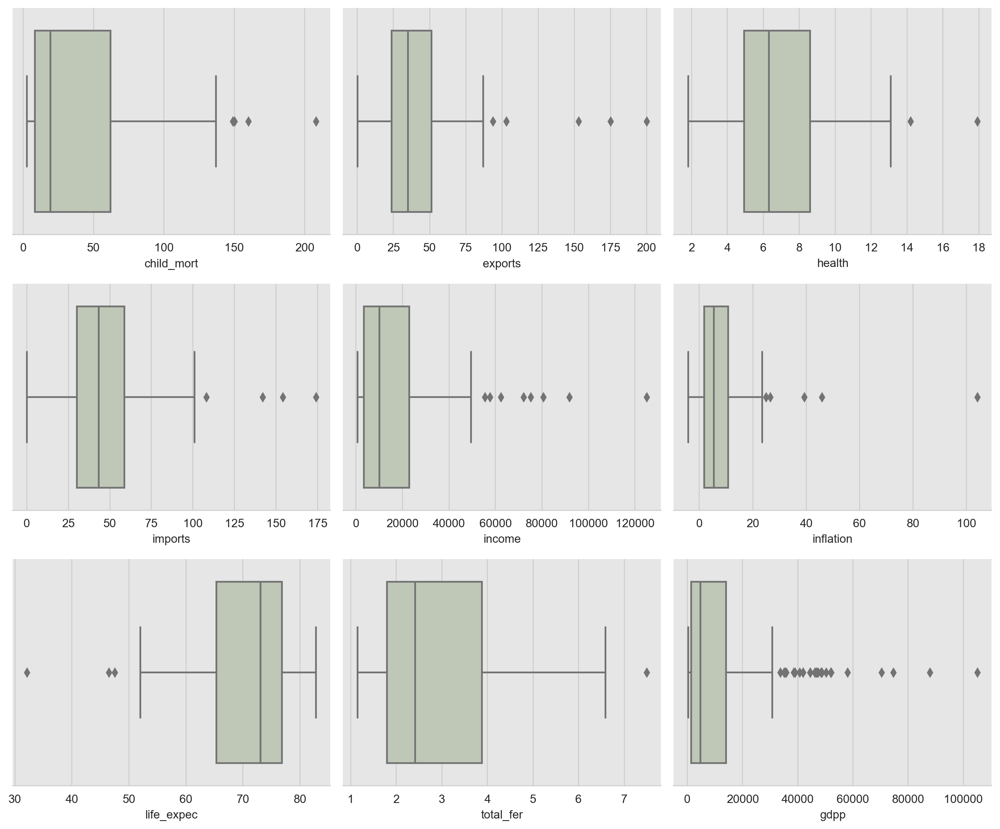

In [8]:
## are there any outliers - visualised

sns.set_style("whitegrid", {"axes.facecolor": ".9"})

plt.figure(figsize=(12,10))
for x, y in enumerate (c_data.describe().columns):
    plt.subplot (3,3, x+1)
    bx = sns.boxplot(x=c_data[y], color = "#BFCAB4")
    #plt.title("{} boxplot". format(y))
    plt.tight_layout()
    sns.despine(left=True)

%config InlineBackend.figure_format='retina'

plt.show()


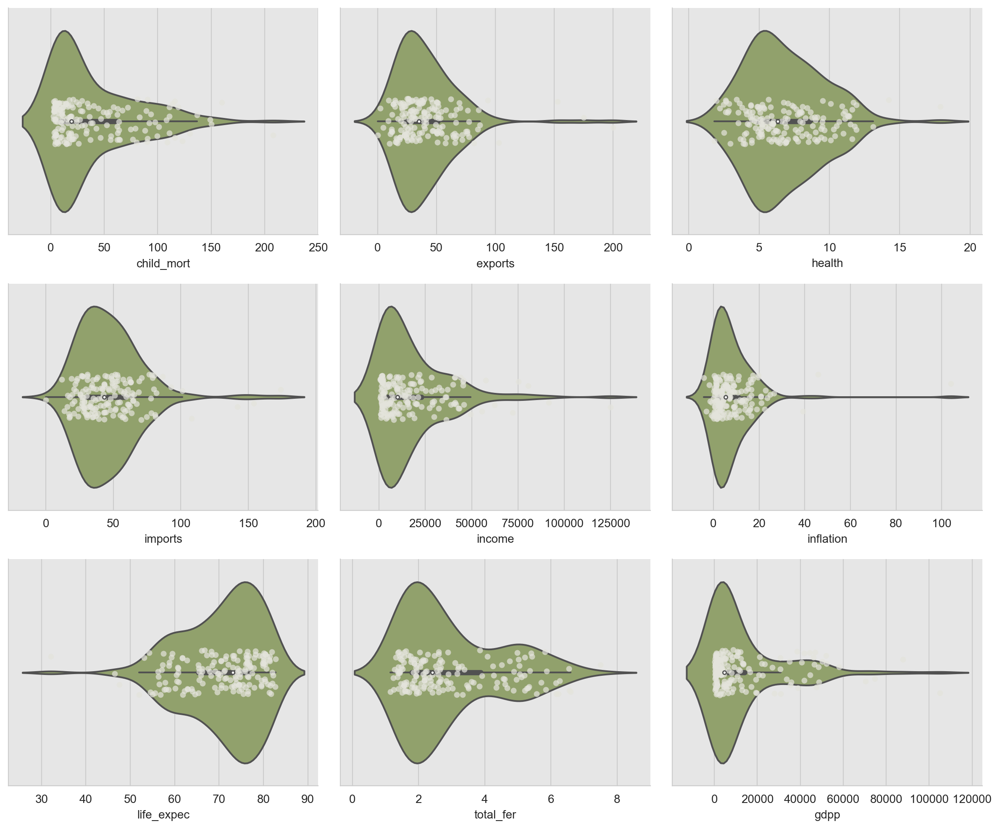

In [9]:
# another way to visualise: violin and swarmplot

plt.figure(figsize=(12,10))

for x, y in enumerate (c_data.describe().columns):
    plt.subplot(3,3, x+1)
    st = sns.stripplot(x=c_data[y], color="#E4E4DC", alpha = 0.7)
    vn = sns.violinplot(x=c_data[y], color = "#95AA63")
    #plt.title("{} violin and swarm". format(y))
    plt.tight_layout()
    sns.despine()

%config InlineBackend.figure_format='retina'

plt.show()

from all of these, we can see the most outliers exist in gdpp and income. However we will not remove these outliers yet as they are part of the country's data, and will reevaluate after using our clustering models. 
<br> below is the code: 

In [10]:
""" columns = c_data.iloc[1:]
# Iterate over each column and remove outliers
for column in columns:
    max_threshold, min_threshold = c_data[column].quantile([0.75, 0.25])
    new_df = pcos_data[(c_data[column] > min_threshold) & (c_data[column] < max_threshold)]
    # Update the original DataFrame with the new values
    df = new_df.copy()
# Print the updated DataFrame
print(df) """ 

' columns = c_data.iloc[1:]\n# Iterate over each column and remove outliers\nfor column in columns:\n    max_threshold, min_threshold = c_data[column].quantile([0.75, 0.25])\n    new_df = pcos_data[(c_data[column] > min_threshold) & (c_data[column] < max_threshold)]\n    # Update the original DataFrame with the new values\n    df = new_df.copy()\n# Print the updated DataFrame\nprint(df) '

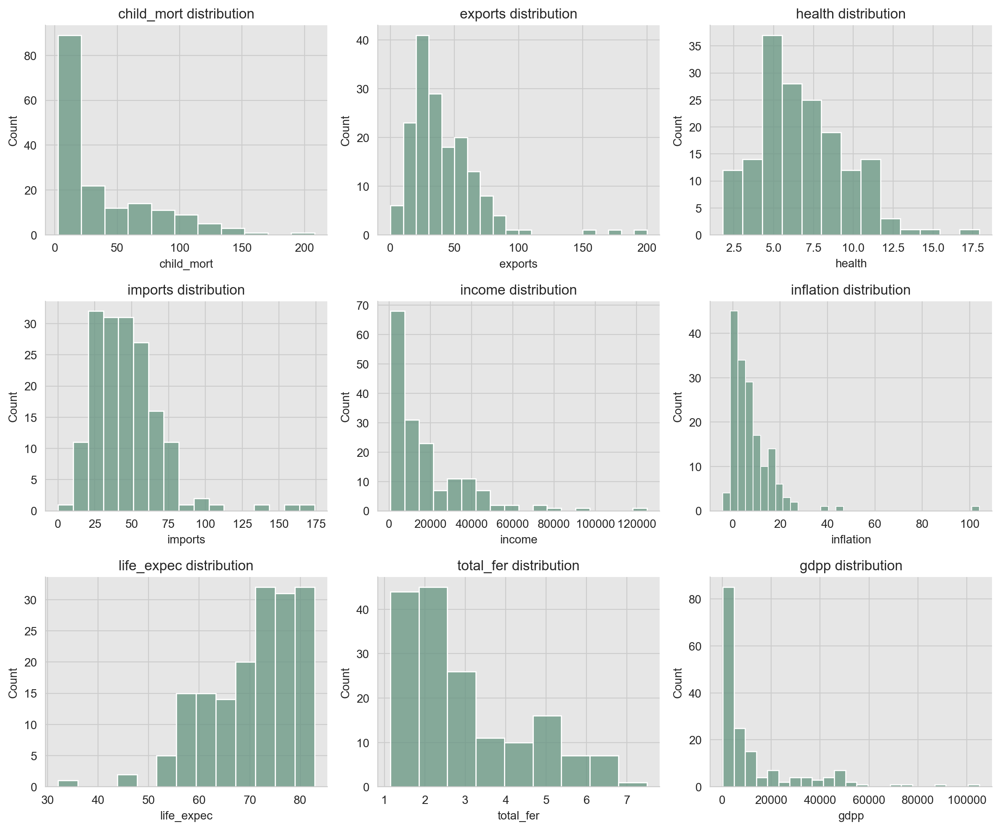

In [11]:
# checking the skew of the data
plt.figure(figsize=(12,10))

for x, y in enumerate (c_data.describe().columns):
    plt.subplot(3,3, x+1)
    sns.histplot(x=c_data[y], color = "#659580")
    plt.xlabel(y)
    plt.title("{} distribution". format(y))
    plt.tight_layout()
    sns.despine(bottom=False, left= False)
    
plt.show()
%config InlineBackend.figure_format='retina'


as you can see, the data is quite skewed.
<br> right skewed distribution: child_mort, exports, health, import, income, inflation, total_fer and gdpp
<br> left skewed distribution: life_expec 


the following have bimodal or multimodal distribution:
 - life expec, 
 - total_fer
 - imports 


In [12]:
# How do the variables correlate with each other?
corr_c_data = c_data.corr(numeric_only=True)
corr_c_data

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
child_mort,1.000000,-0.318093,-0.200402,-0.127211,-0.524315,0.288276,-0.886676,0.848478,-0.483032
exports,-0.318093,1.000000,-0.114408,0.737381,0.516784,-0.107294,0.316313,-0.320011,0.418725
health,-0.200402,-0.114408,1.000000,0.095717,0.129579,-0.255376,0.210692,-0.196674,0.345966
imports,-0.127211,0.737381,0.095717,1.000000,0.122406,-0.246994,0.054391,-0.159048,0.115498
income,-0.524315,0.516784,0.129579,0.122406,1.000000,-0.147756,0.611962,-0.501840,0.895571
inflation,0.288276,-0.107294,-0.255376,-0.246994,-0.147756,1.000000,-0.239705,0.316921,-0.221631
life_expec,-0.886676,0.316313,0.210692,0.054391,0.611962,-0.239705,1.000000,-0.760875,0.600089
total_fer,0.848478,-0.320011,-0.196674,-0.159048,-0.501840,0.316921,-0.760875,1.000000,-0.454910
gdpp,-0.483032,0.418725,0.345966,0.115498,0.895571,-0.221631,0.600089,-0.454910,1.000000


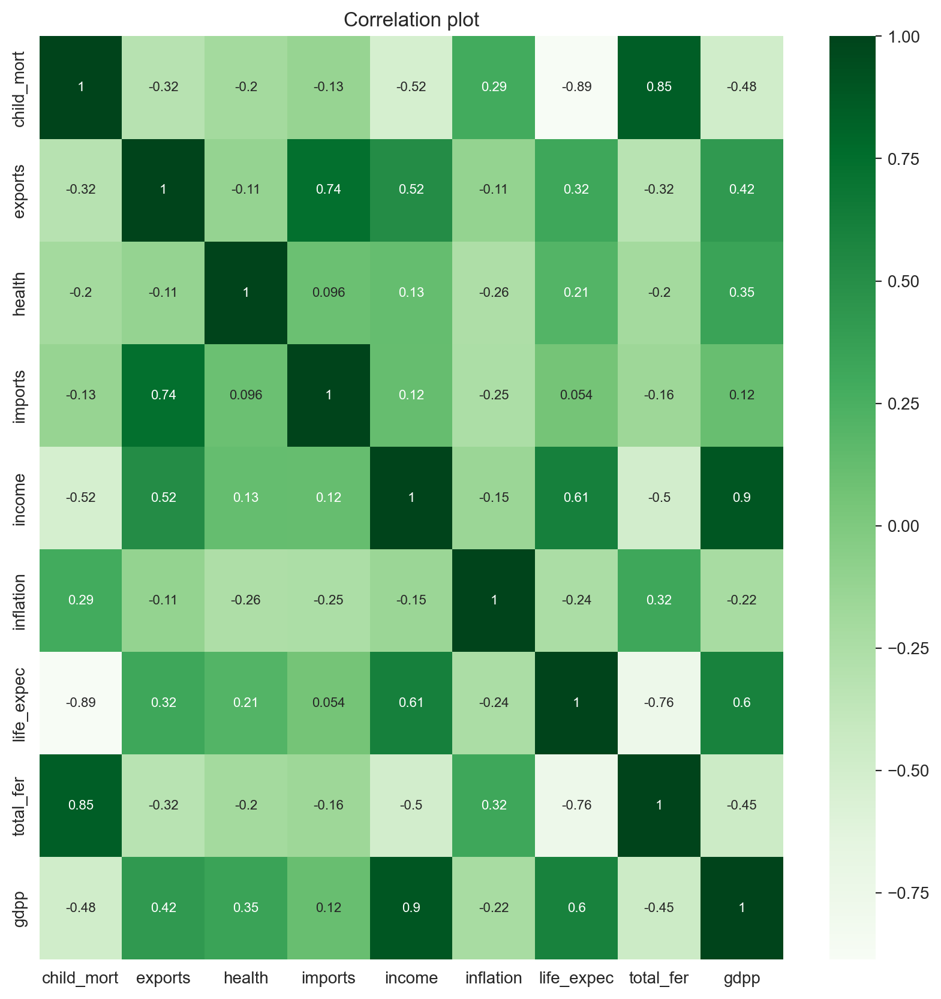

In [13]:
# visualising correlation

## heatmap 
plt.figure(figsize=(10,10))
sns.heatmap(corr_c_data, annot= True, cmap= "Greens", annot_kws={"size" : 8}) 
plt.title('Correlation plot', loc = "center")
plt.show()
%config InlineBackend.figure_format='retina'

In [14]:
corr_c_data["gdpp"].sort_values(ascending=False)

gdpp          1.000000
income        0.895571
life_expec    0.600089
exports       0.418725
health        0.345966
imports       0.115498
inflation    -0.221631
total_fer    -0.454910
child_mort   -0.483032
Name: gdpp, dtype: float64

In [15]:
## making it easier for me to read the correlations and identify potential relationships 
sorted_mat = corr_c_data.unstack().sort_values(ascending=False).drop_duplicates()
sorted_mat

child_mort  child_mort    1.000000
gdpp        income        0.895571
child_mort  total_fer     0.848478
imports     exports       0.737381
income      life_expec    0.611962
gdpp        life_expec    0.600089
income      exports       0.516784
exports     gdpp          0.418725
gdpp        health        0.345966
inflation   total_fer     0.316921
exports     life_expec    0.316313
child_mort  inflation     0.288276
health      life_expec    0.210692
            income        0.129579
imports     income        0.122406
            gdpp          0.115498
            health        0.095717
            life_expec    0.054391
exports     inflation    -0.107294
            health       -0.114408
imports     child_mort   -0.127211
income      inflation    -0.147756
imports     total_fer    -0.159048
total_fer   health       -0.196674
health      child_mort   -0.200402
gdpp        inflation    -0.221631
inflation   life_expec   -0.239705
            imports      -0.246994
health      inflatio

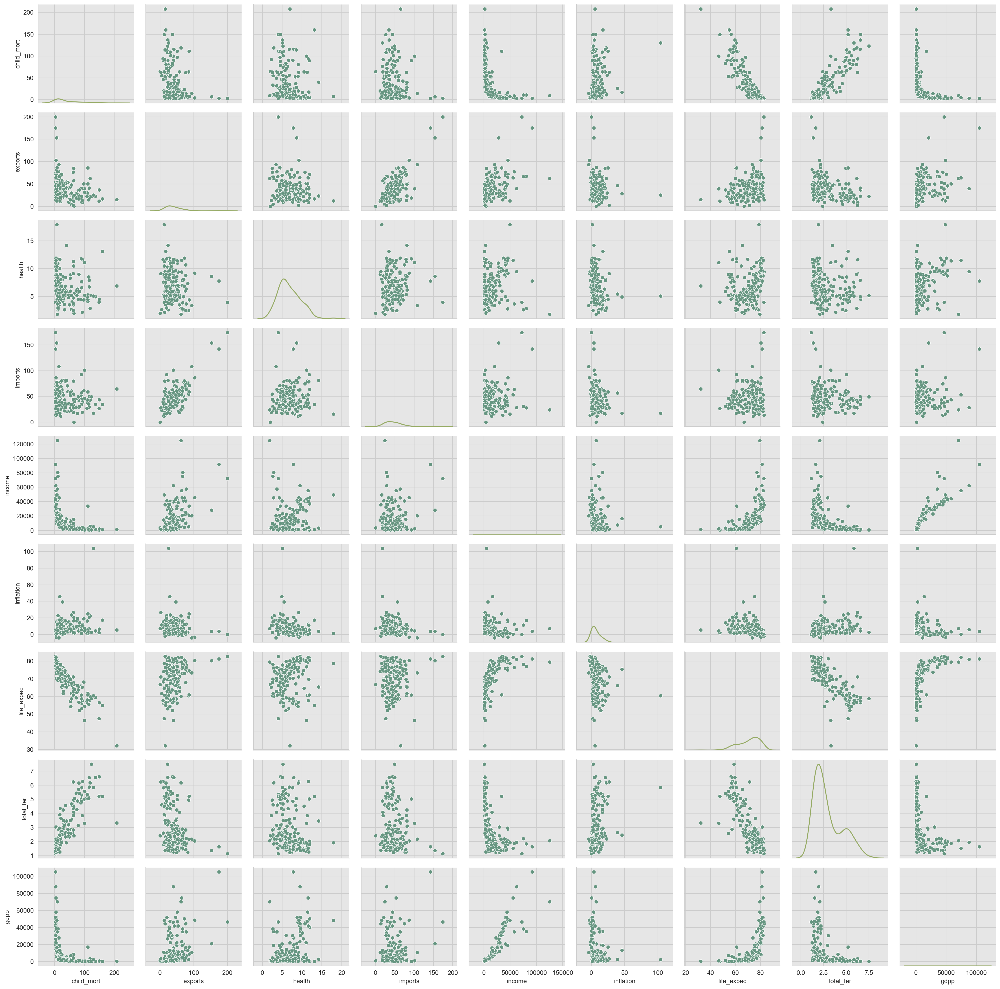

In [16]:
## pair grid 
p = sns.PairGrid(c_data)
p.map_offdiag(sns.scatterplot, color="#659580")
p.map_diag(sns.kdeplot, color = "#95AA63")

there's a lot to take in here
<br> some features have an inverse relationship
<br> some dont 

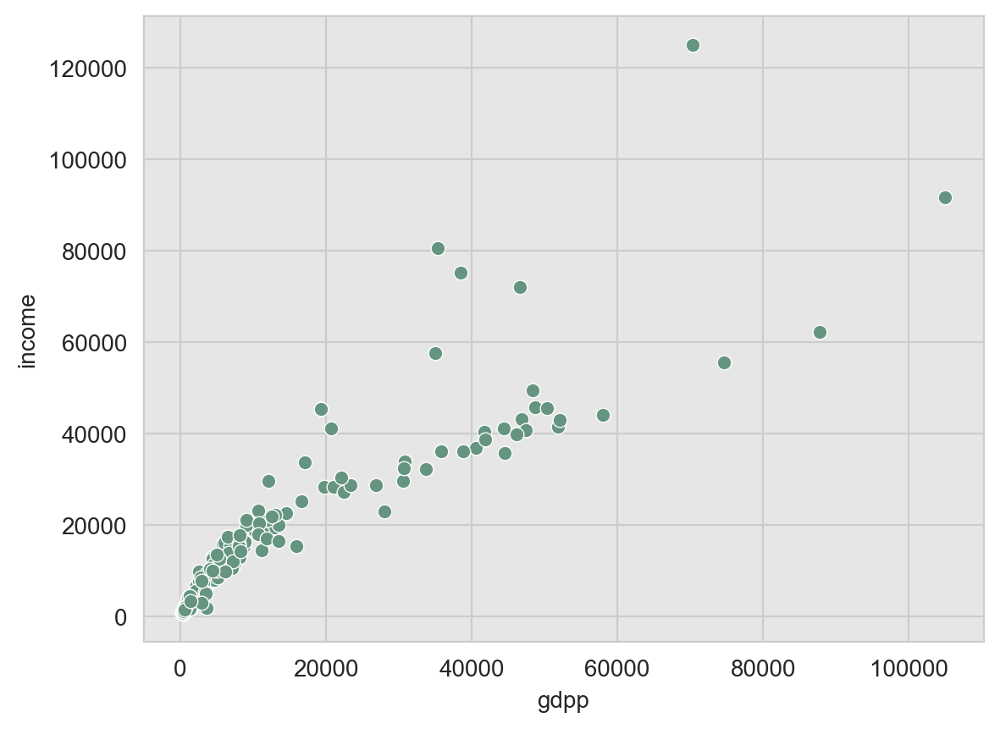

In [17]:
""" the top correlating features: 
gdpp        income        0.895571
child_mort  total_fer     0.848478
imports     exports       0.737381
income      life_expec    0.611962
gdpp        life_expec    0.600089
income      exports       0.516784
exports     gdpp          0.418725 """
#highlighting from the pairgrid 
figsize=(8,5)
sns.scatterplot(data=c_data, x="gdpp", y="income", color = "#659580")
plt.show()

<Axes: xlabel='child_mort', ylabel='total_fer'>

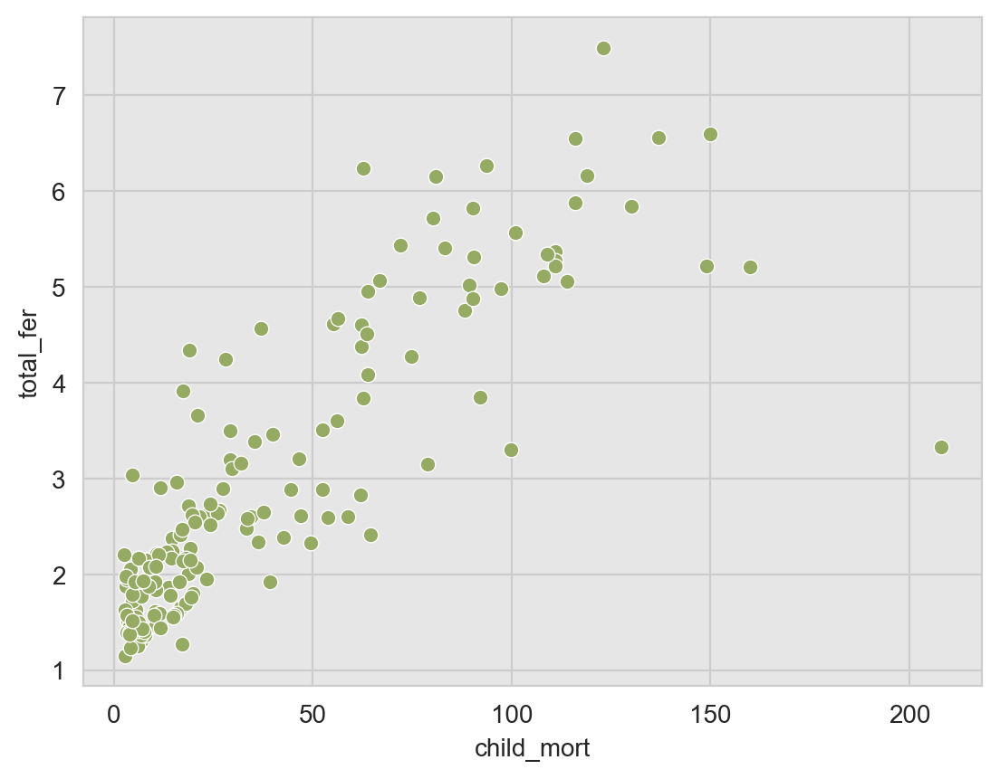

In [18]:
# child mortality and total_fer
figsize=(8,5)
sns.scatterplot(data=c_data, x="child_mort", y="total_fer", color="#95aa63")

<Axes: xlabel='imports', ylabel='exports'>

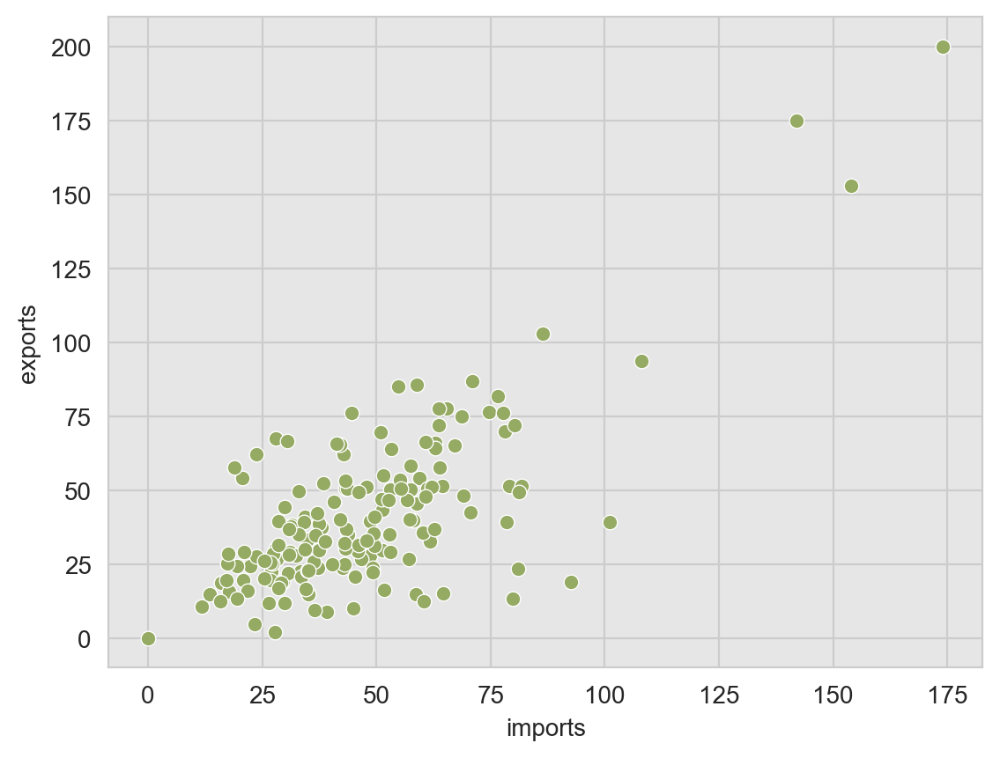

In [124]:
## relationship between imports and exports
figsize=(8,5)
sns.scatterplot(data=c_data, x="imports", y="exports", color="#95aa63")

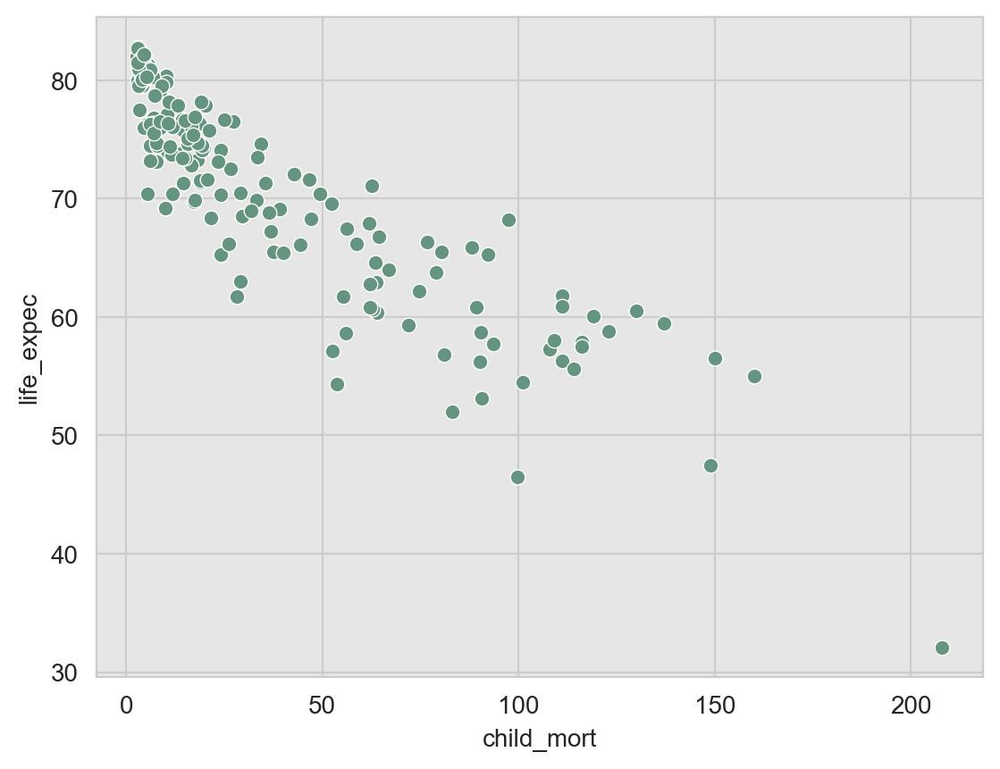

In [20]:
# relationship between child mortality and life expectancy 
figsize=(8,5)
sns.scatterplot(data=c_data, x="child_mort", y="life_expec", color = "#659580")
plt.show()

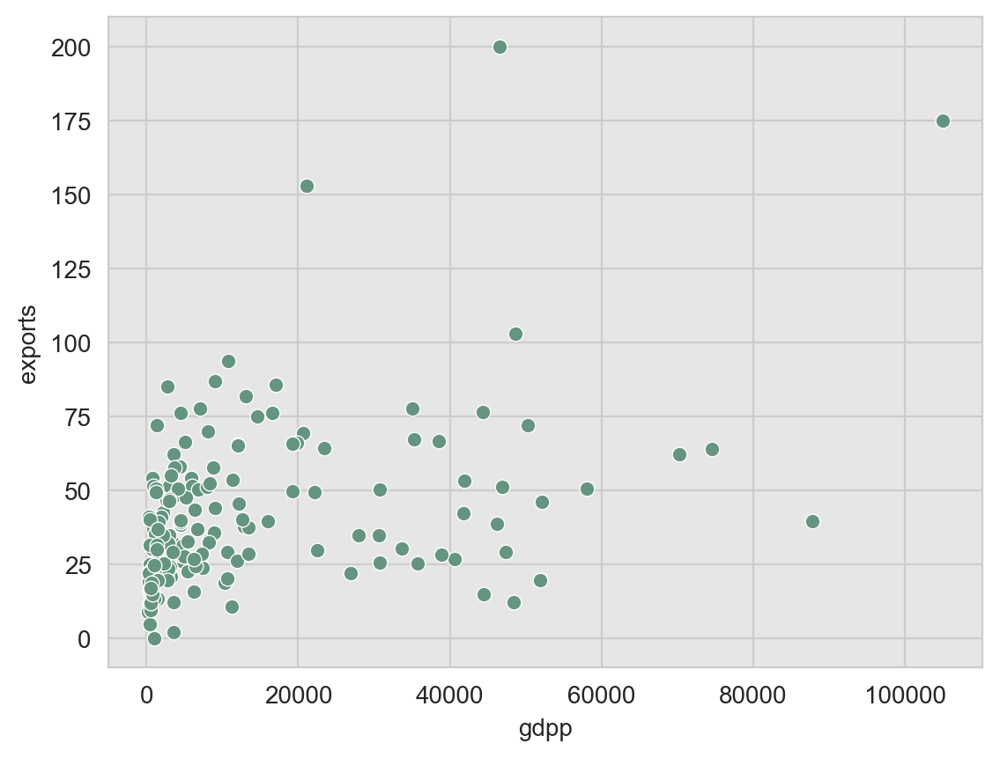

In [125]:
figsize=(8,5)
sns.scatterplot(data=c_data, x="gdpp", y="exports", color = "#659580")
plt.show()

Generally, the development of a country can be measured by many indicators. It must not only take into account economic indicators, but other indicators for qualify of life etc. 
<br> In general we can ascertain:
 - a low gdpp 
 - a low income 
 - a high child mortality 
 - a high life expectancy 
 - low health spending 

<br> as well as many other factors e.g. birth rate, death rate, HDI, literacy rate etc but we are confined to the ones we have in this dataset. 
<br> As seen from the heatmap and correlation matrix, a high life expectancy is correlated with a low child mortality. A higher income is correlated with a high gdpp. Income and GDPP is also related with life expectancy. 
<br> Taking all of these into account, we can create our own least developed countries, or ones that need the most assistance. 

 

In [21]:
c_data.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200


In [23]:
c_data.sort_values(by="income", ascending=False)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
123,Qatar,9.0,62.30,1.81,23.8,125000,6.980,79.5,2.07,70300
91,Luxembourg,2.8,175.00,7.77,142.0,91700,3.620,81.3,1.63,105000
23,Brunei,10.5,67.40,2.84,28.0,80600,16.700,77.1,1.84,35300
82,Kuwait,10.8,66.70,2.63,30.4,75200,11.200,78.2,2.21,38500
133,Singapore,2.8,200.00,3.96,174.0,72100,-0.046,82.7,1.15,46600
...,...,...,...,...,...,...,...,...,...,...
31,Central African Republic,149.0,11.80,3.98,26.5,888,2.010,47.5,5.21,446
112,Niger,123.0,22.20,5.16,49.1,814,2.550,58.8,7.49,348
26,Burundi,93.6,8.92,11.60,39.2,764,12.300,57.7,6.26,231
88,Liberia,89.3,19.10,11.80,92.6,700,5.470,60.8,5.02,327


In [24]:
#how many unique values are there in each? 
c_data.nunique()

country       167
child_mort    139
exports       147
health        147
imports       151
income        156
inflation     156
life_expec    127
total_fer     138
gdpp          157
dtype: int64

## Data preprocessing

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


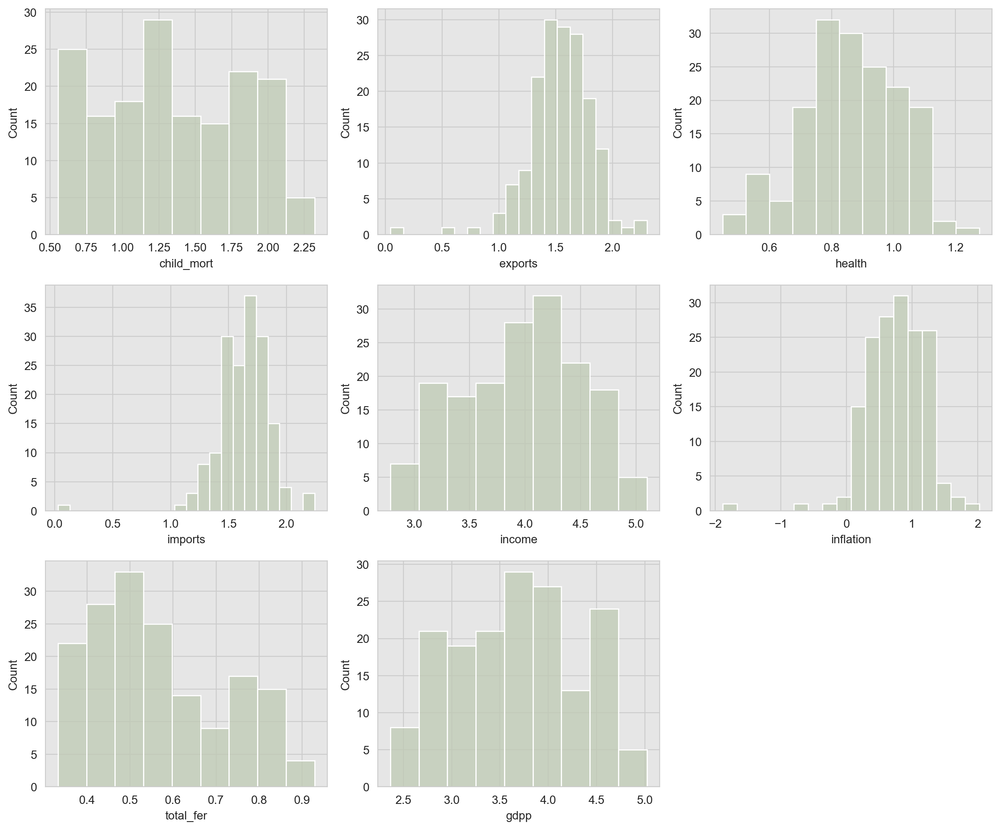

In [25]:
## log transform right-skewed data 
log_var = ["child_mort", "exports", "health", "imports", "income", "inflation", "total_fer","gdpp"]


fig = plt.figure(figsize = (12, 10))

for j in range (len (log_var)):
    var = log_var[j]
    transformed = "log_" + var
    c_data[transformed] = np.log10(c_data [var]+1)
    sub = fig.add_subplot(3, 3, j + 1)
    sub.set_xlabel(var)
    sns.histplot(x=c_data[transformed], color = "#BFCAB4")
    #c_data[transformed].plot(kind="hist",color = "#E4E4DC")
    plt.tight_layout()

    %config InlineBackend.figure_format='retina'



In [26]:
#sqrt transform for left skewed data 
c_data.insert(len(c_data.columns), "sqrt_lifeexpec", 
              np.sqrt(max(c_data.iloc[:, 7]+1) - c_data.iloc[:, 7]))


<Axes: xlabel='sqrt_lifeexpec', ylabel='Count'>

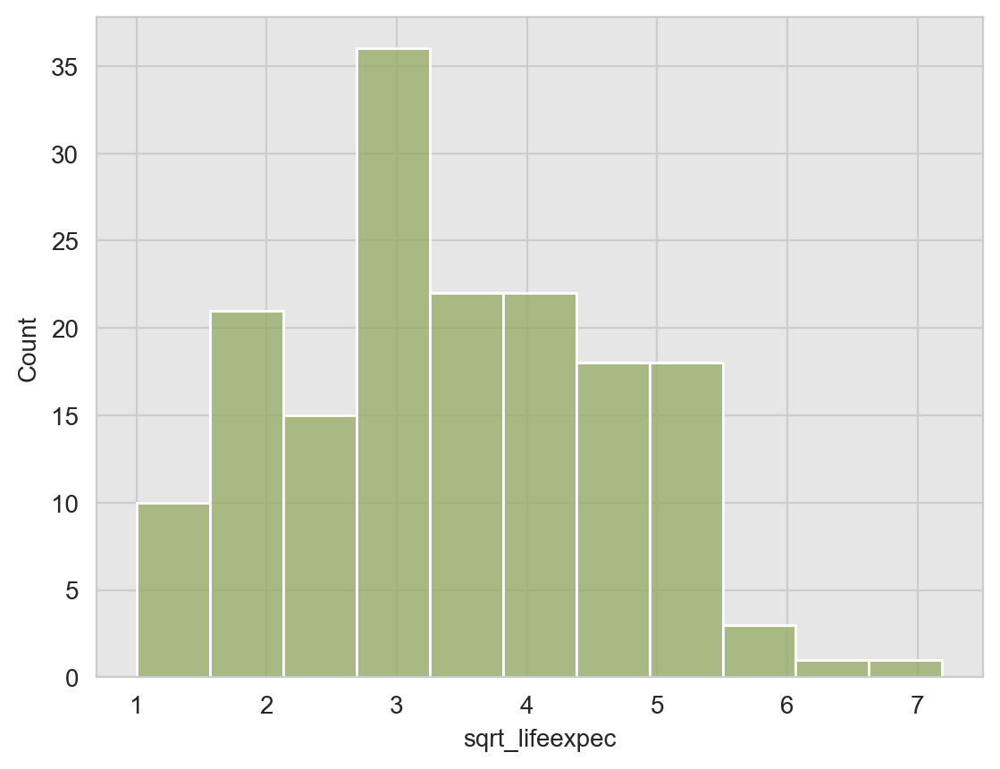

In [27]:
sns.histplot(data=c_data, x="sqrt_lifeexpec", color = "#95AA63")

In [28]:
c_data.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,log_child_mort,log_exports,log_health,log_imports,log_income,log_inflation,log_total_fer,log_gdpp,sqrt_lifeexpec
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1.959995,1.041393,0.933487,1.661813,3.207096,1.018700,0.833784,2.743510,5.253570
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,1.245513,1.462398,0.877947,1.695482,3.996993,0.739572,0.423246,3.611829,2.738613
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,1.451786,1.595496,0.713491,1.510545,4.110623,1.232996,0.589950,3.649432,2.701851
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,2.079181,1.801404,0.585461,1.642465,3.770926,1.369216,0.854913,3.547898,4.868265
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,1.053078,1.667453,0.846955,1.777427,4.281056,0.387390,0.495544,4.086395,2.645751


In [29]:
c_data.isnull().sum()

country           0
child_mort        0
exports           0
health            0
imports           0
income            0
inflation         0
life_expec        0
total_fer         0
gdpp              0
log_child_mort    0
log_exports       0
log_health        0
log_imports       0
log_income        0
log_inflation     4
log_total_fer     0
log_gdpp          0
sqrt_lifeexpec    0
dtype: int64

In [30]:
## dealing with null values in log_inflation and replacing with median 
c_data["log_inflation"].fillna(c_data["log_inflation"].median(), inplace=True)
c_data.isnull().sum()

country           0
child_mort        0
exports           0
health            0
imports           0
income            0
inflation         0
life_expec        0
total_fer         0
gdpp              0
log_child_mort    0
log_exports       0
log_health        0
log_imports       0
log_income        0
log_inflation     0
log_total_fer     0
log_gdpp          0
sqrt_lifeexpec    0
dtype: int64

In [31]:
tr_data = c_data.drop(c_data.iloc[:, 1:10], axis=1)
tr_data.head()

,country,log_child_mort,log_exports,log_health,log_imports,log_income,log_inflation,log_total_fer,log_gdpp,sqrt_lifeexpec
0,Afghanistan,1.959995,1.041393,0.933487,1.661813,3.207096,1.018700,0.833784,2.743510,5.253570
1,Albania,1.245513,1.462398,0.877947,1.695482,3.996993,0.739572,0.423246,3.611829,2.738613
2,Algeria,1.451786,1.595496,0.713491,1.510545,4.110623,1.232996,0.589950,3.649432,2.701851
3,Angola,2.079181,1.801404,0.585461,1.642465,3.770926,1.369216,0.854913,3.547898,4.868265
4,Antigua and Barbuda,1.053078,1.667453,0.846955,1.777427,4.281056,0.387390,0.495544,4.086395,2.645751


In [32]:
## standardise 
scaler_x = StandardScaler()
data_scale = np.array(tr_data.iloc[:, 1:])
scaled = scaler_x.fit_transform(data_scale.astype(float))
scaled_df = pd.DataFrame(scaled, columns = ["log_child_mort", "log_exports", "log_health", "log_imports", "log_income", "log_inflation", "log_total_fer", "log_gdpp", "sqrt_lifeexpec"])
scaled_df

,log_child_mort,log_exports,log_health,log_imports,log_income,log_inflation,log_total_fer,log_gdpp,sqrt_lifeexpec
0,1.278012,-1.764313,0.434646,0.147868,-1.413035,0.569973,1.734817,-1.460301,1.492509
1,-0.239708,-0.283872,0.076480,0.291835,0.071660,-0.051628,-0.944336,-0.122835,-0.562970
2,0.198464,0.184161,-0.984056,-0.498946,0.285240,1.047195,0.143564,-0.064916,-0.593016
3,1.531191,0.908223,-1.809687,0.065136,-0.353257,1.350548,1.872702,-0.221309,1.177598
4,-0.648481,0.437193,-0.123376,0.642228,0.605586,-0.835916,-0.472520,0.608135,-0.638866
...,...,...,...,...,...,...,...,...,...
162,0.258411,0.472899,-0.452748,0.439323,-0.918936,-0.454400,0.556415,-0.336823,0.926226
163,-0.213864,-0.257766,-0.609404,-1.529588,0.486145,2.022987,-0.180255,0.675862,-0.432478
164,0.057883,1.125958,0.182041,1.207206,-0.576146,0.789483,-0.640383,-0.884089,-0.127779
165,0.849258,-0.182023,-0.484292,-0.334500,-0.577965,1.398915,1.211428,-0.884089,0.498470


### K-Means 

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to '

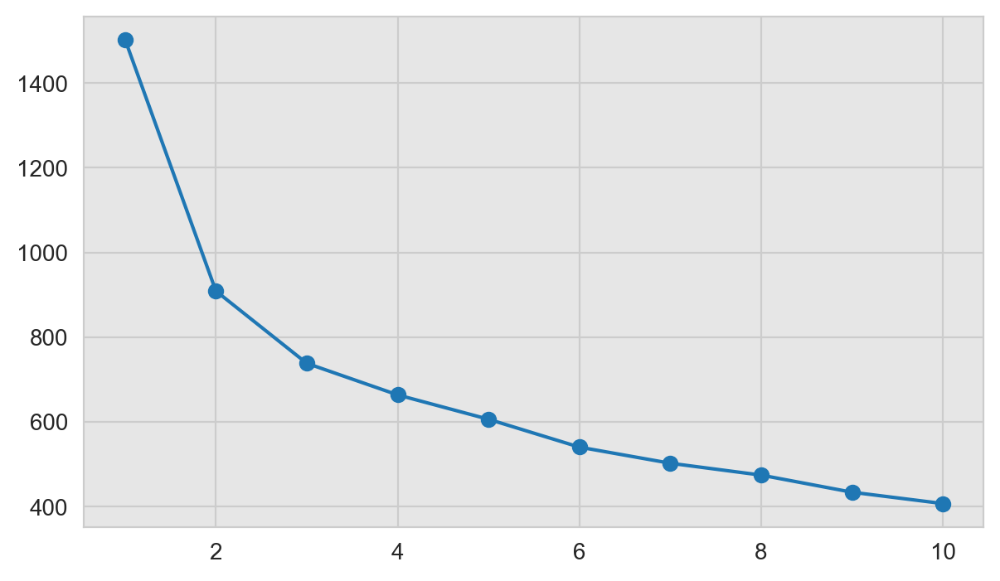

In [34]:
## finding the best amount of clusters (elbow)
from sklearn.cluster import KMeans
x = scaled_df.iloc[:,:]
wcss = [] 
k_range = range(1,11)
for i in k_range:
    kmeans = KMeans(n_clusters = i, init = "k-means++", random_state= 42)
    kmeans.fit(x)
    wcss.append(kmeans.inertia_)

fix, ax = plt.subplots(figsize=(7,4))
plt.plot(k_range, wcss, marker = "o")

In [35]:
# confirming amount of clusters
from kneed import KneeLocator 
ke = KneeLocator(range(1,11), wcss, curve="convex", direction="decreasing")
ke.elbow

3

## KMeans Clustering

In [36]:
kmeans = KMeans(n_clusters=3, n_init=15)
kmeans.fit(scaled_df)
print("WCSS: ", kmeans.inertia_)
print("Iternations until converged: ", kmeans.n_iter_)
print("Final centroids: ")
print(kmeans.cluster_centers_)
print("Cluster assignments ")
print(kmeans.labels_)


WCSS:  738.3653486703348
Iternations until converged:  11
Final centroids: 
[[ 0.00745729  0.23816953 -0.46720608 -0.01789454  0.18762163  0.39029977
  -0.17115189  0.05629909 -0.00225382]
 [-1.13479324  0.41569812  0.79339404  0.22496146  0.91727202 -0.87998214
  -0.9137566   1.02954001 -1.04024263]
 [ 1.22042346 -0.80072981 -0.17501865 -0.21783641 -1.27078225  0.38188095
   1.24278866 -1.19981229  1.13208273]]
Cluster assignments 
[2 0 0 2 1 0 0 1 1 0 1 0 2 1 0 1 0 2 0 0 1 0 0 0 1 2 2 0 2 1 0 2 2 1 0 0 2
 2 0 1 2 1 1 1 1 0 0 0 0 0 2 1 0 1 1 0 2 0 1 2 1 0 0 2 2 0 2 1 1 2 0 0 0 1
 1 1 0 1 0 0 2 2 0 0 2 1 1 2 2 0 1 1 1 2 2 0 0 2 1 2 1 2 0 0 1 0 2 2 0 2 1
 1 2 2 1 0 2 1 0 0 0 1 1 0 0 0 2 0 0 2 1 0 2 1 1 1 2 0 1 1 0 0 2 0 1 1 2 2
 0 2 2 0 0 0 0 2 0 0 1 1 1 0 0 0 0 2 2]


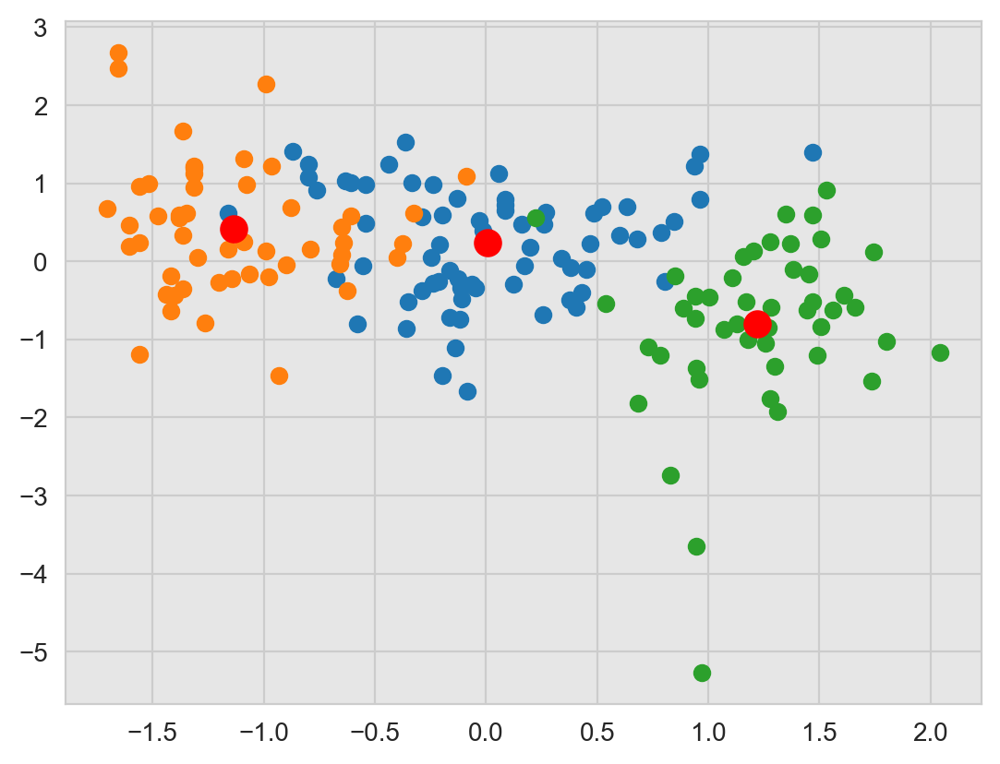

In [37]:
## visualise clustering 
fig, ax = plt.subplots()
idxs = np.unique(kmeans.labels_)
sc_col = ["#95AA63", "#BFCAB4", "#659580"]
for i in idxs:
    #Points of cluster
    points = scaled_df.iloc[kmeans.labels_==i,:]
    #Plot points
    plt.scatter(points.iloc[:,0], points.iloc[:,1])
    #Plot centroids
    plt.scatter(kmeans.cluster_centers_[i][0], kmeans.cluster_centers_[i][1], s=100, c='red')


In [38]:
## adding cluster to data to be able to analyse
scaled_df["cluster"] = kmeans.labels_
scaled_df.head()

,log_child_mort,log_exports,log_health,log_imports,log_income,log_inflation,log_total_fer,log_gdpp,sqrt_lifeexpec,cluster
0,1.278012,-1.764313,0.434646,0.147868,-1.413035,0.569973,1.734817,-1.460301,1.492509,2
1,-0.239708,-0.283872,0.076480,0.291835,0.071660,-0.051628,-0.944336,-0.122835,-0.562970,0
2,0.198464,0.184161,-0.984056,-0.498946,0.285240,1.047195,0.143564,-0.064916,-0.593016,0
3,1.531191,0.908223,-1.809687,0.065136,-0.353257,1.350548,1.872702,-0.221309,1.177598,2
4,-0.648481,0.437193,-0.123376,0.642228,0.605586,-0.835916,-0.472520,0.608135,-0.638866,1


In [39]:
c_data["cluster"] = kmeans.labels_
c_data

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,log_child_mort,log_exports,log_health,log_imports,log_income,log_inflation,log_total_fer,log_gdpp,sqrt_lifeexpec,cluster
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1.959995,1.041393,0.933487,1.661813,3.207096,1.018700,0.833784,2.743510,5.253570,2
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,1.245513,1.462398,0.877947,1.695482,3.996993,0.739572,0.423246,3.611829,2.738613,0
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,1.451786,1.595496,0.713491,1.510545,4.110623,1.232996,0.589950,3.649432,2.701851,0
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,2.079181,1.801404,0.585461,1.642465,3.770926,1.369216,0.854913,3.547898,4.868265,2
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,1.053078,1.667453,0.846955,1.777427,4.281056,0.387390,0.495544,4.086395,2.645751,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,1.480007,1.677607,0.795880,1.729974,3.469969,0.558709,0.653213,3.472903,4.560702,0
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,1.257679,1.469822,0.771587,1.269513,4.217510,1.671173,0.540329,4.130366,2.898275,0
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,1.385606,1.863323,0.894316,1.909556,3.652343,1.117271,0.469822,3.117603,3.271085,0
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,1.758155,1.491362,0.790988,1.549003,3.651375,1.390935,0.753583,3.117603,4.037326,2


In [40]:
clus_a = c_data.drop(c_data.iloc[:, 10:19], axis = 1)
clus_a.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,cluster
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,2
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,0
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,0
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,2
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,1


In [41]:
clus_a["cluster"].value_counts()

cluster
0    69
1    51
2    47
Name: count, dtype: int64

In [70]:
# the cluster 2 countries 
clus_a[clus_a["cluster"]==2].sort_values(by=["cluster"], ascending=True)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,cluster
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,2
94,Malawi,90.5,22.8,6.59,34.9,1030,12.10,53.1,5.31,459,2
97,Mali,137.0,22.8,4.98,35.1,1870,4.37,59.5,6.55,708,2
99,Mauritania,97.4,50.7,4.41,61.2,3320,18.90,68.2,4.98,1200,2
101,"Micronesia, Fed. Sts.",40.0,23.5,14.20,81.0,3340,3.80,65.4,3.46,2860,2
106,Mozambique,101.0,31.5,5.21,46.2,918,7.64,54.5,5.56,419,2


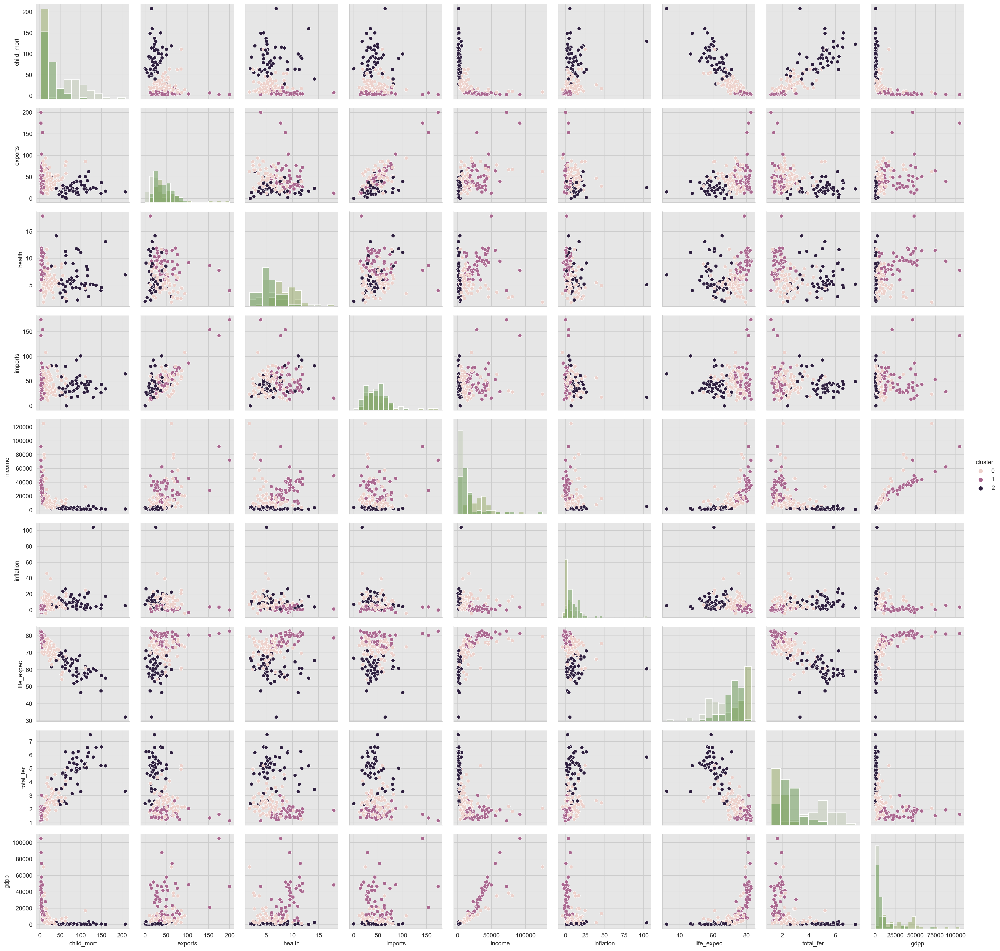

In [49]:
## pair grid 
pagr = ["#659850", "#95AA63", "#BFCAB4"]
clust = sns.PairGrid(clus_a, hue="cluster")
clust.map_offdiag(sns.scatterplot, palette=pagr)
clust.map_diag(sns.histplot, palette=pagr)
clust.add_legend()

In [61]:
clus_a.describe().columns

Index(['child_mort', 'exports', 'health', 'imports', 'income', 'inflation',
       'life_expec', 'total_fer', 'gdpp', 'cluster'],
      dtype='object')

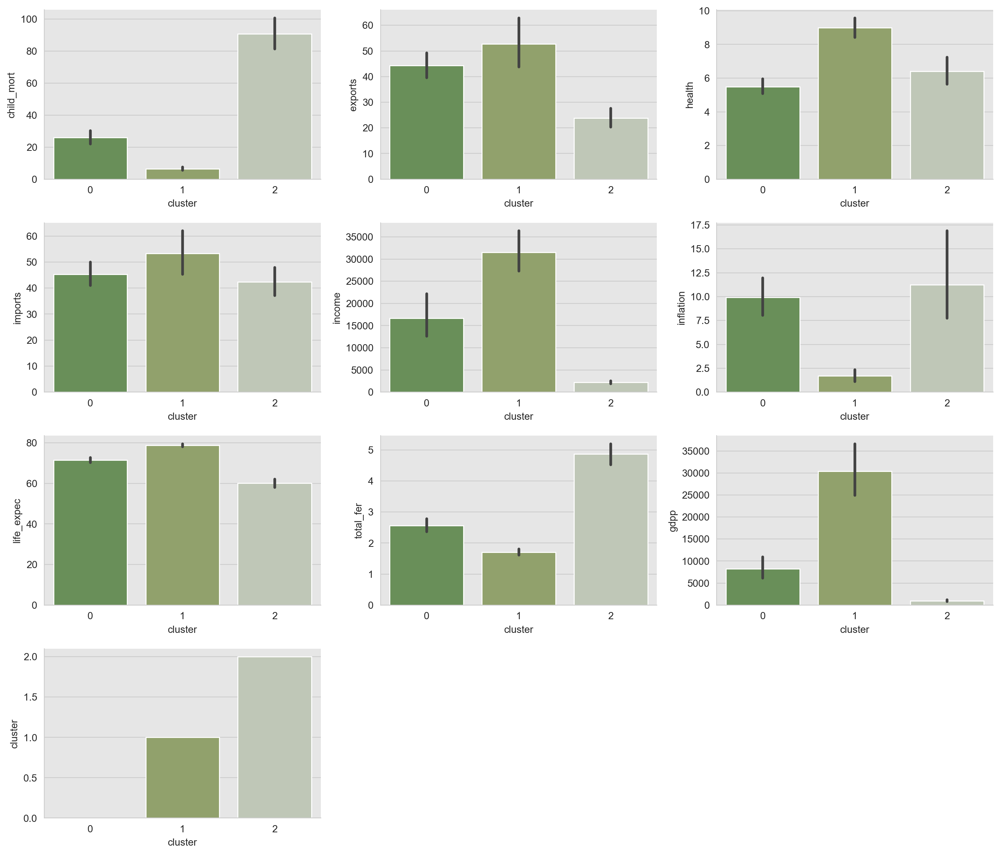

In [109]:
## visualising our variables

plt.figure(figsize=(14,12))

for x, y in enumerate (clus_a.describe().columns):
    plt.subplot(4,3, x+1)
    sns.barplot(y=clus_a[y], x=clus_a.iloc[:, -1], palette=pagr)
    plt.tight_layout()
    sns.despine()

%config InlineBackend.figure_format='retina'

plt.show()


from these bar plots we can ascertain that cluster 2 countries generally have the most need. 
<br> they have a the lowest gdpp, lowest life expec, the lowest income, the lowest imports, the lowest exports, the highest child mortality, the highest total_fer and highest total inflation. 

In [67]:
clus_2 = clus_a[clus_a["cluster"]==2]["country"]
clus_2

0                   Afghanistan
3                        Angola
12                   Bangladesh
17                        Benin
25                 Burkina Faso
26                      Burundi
28                     Cameroon
31     Central African Republic
32                         Chad
36                      Comoros
37             Congo, Dem. Rep.
40                Cote d'Ivoire
50                      Eritrea
56                       Gambia
59                        Ghana
63                       Guinea
64                Guinea-Bissau
66                        Haiti
69                        India
80                        Kenya
81                     Kiribati
84                          Lao
87                      Lesotho
88                      Liberia
93                   Madagascar
94                       Malawi
97                         Mali
99                   Mauritania
101       Micronesia, Fed. Sts.
106                  Mozambique
107                     Myanmar
109     

In [73]:
# the cluster 2 countries top 10 countries by lowest gdpp
clus_a[clus_a["cluster"]==2].sort_values(by=["gdpp"], ascending=True).head(10)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,cluster
26,Burundi,93.6,8.92,11.60,39.2,764,12.30,57.7,6.26,231,2
88,Liberia,89.3,19.10,11.80,92.6,700,5.47,60.8,5.02,327,2
37,"Congo, Dem. Rep.",116.0,41.10,7.91,49.6,609,20.80,57.5,6.54,334,2
112,Niger,123.0,22.20,5.16,49.1,814,2.55,58.8,7.49,348,2
132,Sierra Leone,160.0,16.80,13.10,34.5,1220,17.20,55.0,5.20,399,2
93,Madagascar,62.2,25.00,3.77,43.0,1390,8.79,60.8,4.60,413,2
106,Mozambique,101.0,31.50,5.21,46.2,918,7.64,54.5,5.56,419,2
31,Central African Republic,149.0,11.80,3.98,26.5,888,2.01,47.5,5.21,446,2
94,Malawi,90.5,22.80,6.59,34.9,1030,12.10,53.1,5.31,459,2
50,Eritrea,55.2,4.79,2.66,23.3,1420,11.60,61.7,4.61,482,2


In [75]:
clus_a[clus_a["cluster"]==2].sort_values(by=["child_mort"], ascending=False).head(10)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,cluster
66,Haiti,208.0,15.3,6.91,64.7,1500,5.45,32.1,3.33,662,2
132,Sierra Leone,160.0,16.8,13.10,34.5,1220,17.20,55.0,5.20,399,2
32,Chad,150.0,36.8,4.53,43.5,1930,6.39,56.5,6.59,897,2
31,Central African Republic,149.0,11.8,3.98,26.5,888,2.01,47.5,5.21,446,2
97,Mali,137.0,22.8,4.98,35.1,1870,4.37,59.5,6.55,708,2
113,Nigeria,130.0,25.3,5.07,17.4,5150,104.00,60.5,5.84,2330,2
112,Niger,123.0,22.2,5.16,49.1,814,2.55,58.8,7.49,348,2
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,2
25,Burkina Faso,116.0,19.2,6.74,29.6,1430,6.81,57.9,5.87,575,2
37,"Congo, Dem. Rep.",116.0,41.1,7.91,49.6,609,20.80,57.5,6.54,334,2


the assistance is up to the charity. we have a group of countries that need the assistance. do they want to assist within the lowest gdpp countries? countries with highest child_mort?
<br> we know from our heatmap that gdpp and income are highly correlated. 
<br> from below we can see the correlated relationships. a lot of features are correlated with income but other features are also correlated with each other. 

In [81]:
sorted_mat

child_mort  child_mort    1.000000
gdpp        income        0.895571
child_mort  total_fer     0.848478
imports     exports       0.737381
income      life_expec    0.611962
gdpp        life_expec    0.600089
income      exports       0.516784
exports     gdpp          0.418725
gdpp        health        0.345966
inflation   total_fer     0.316921
exports     life_expec    0.316313
child_mort  inflation     0.288276
health      life_expec    0.210692
            income        0.129579
imports     income        0.122406
            gdpp          0.115498
            health        0.095717
            life_expec    0.054391
exports     inflation    -0.107294
            health       -0.114408
imports     child_mort   -0.127211
income      inflation    -0.147756
imports     total_fer    -0.159048
total_fer   health       -0.196674
health      child_mort   -0.200402
gdpp        inflation    -0.221631
inflation   life_expec   -0.239705
            imports      -0.246994
health      inflatio

In [78]:
## countries with lowest income and highest inflation 
## people cannot afford to live 
clus_a[clus_a["cluster"]==2].sort_values(by=["income", "inflation"], ascending=[True, False]).head(10)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,cluster
37,"Congo, Dem. Rep.",116.0,41.10,7.91,49.6,609,20.80,57.5,6.54,334,2
88,Liberia,89.3,19.10,11.80,92.6,700,5.47,60.8,5.02,327,2
26,Burundi,93.6,8.92,11.60,39.2,764,12.30,57.7,6.26,231,2
112,Niger,123.0,22.20,5.16,49.1,814,2.55,58.8,7.49,348,2
31,Central African Republic,149.0,11.80,3.98,26.5,888,2.01,47.5,5.21,446,2
106,Mozambique,101.0,31.50,5.21,46.2,918,7.64,54.5,5.56,419,2
94,Malawi,90.5,22.80,6.59,34.9,1030,12.10,53.1,5.31,459,2
63,Guinea,109.0,30.30,4.93,43.2,1190,16.10,58.0,5.34,648,2
150,Togo,90.3,40.20,7.65,57.3,1210,1.18,58.7,4.87,488,2
132,Sierra Leone,160.0,16.80,13.10,34.5,1220,17.20,55.0,5.20,399,2


the kmeans clustering can be tried with correlated features. However that may exclude countries that need help in areas other than those features. 

In [82]:
clus_a[clus_a["cluster"]==2].sort_values(by=["income"], ascending=True).head(10)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,cluster
37,"Congo, Dem. Rep.",116.0,41.10,7.91,49.6,609,20.80,57.5,6.54,334,2
88,Liberia,89.3,19.10,11.80,92.6,700,5.47,60.8,5.02,327,2
26,Burundi,93.6,8.92,11.60,39.2,764,12.30,57.7,6.26,231,2
112,Niger,123.0,22.20,5.16,49.1,814,2.55,58.8,7.49,348,2
31,Central African Republic,149.0,11.80,3.98,26.5,888,2.01,47.5,5.21,446,2
106,Mozambique,101.0,31.50,5.21,46.2,918,7.64,54.5,5.56,419,2
94,Malawi,90.5,22.80,6.59,34.9,1030,12.10,53.1,5.31,459,2
63,Guinea,109.0,30.30,4.93,43.2,1190,16.10,58.0,5.34,648,2
150,Togo,90.3,40.20,7.65,57.3,1210,1.18,58.7,4.87,488,2
132,Sierra Leone,160.0,16.80,13.10,34.5,1220,17.20,55.0,5.20,399,2


In [92]:
clus_a[clus_a["cluster"]==2].sort_values(by=["income", "life_expec", "gdpp", "child_mort", "imports"], ascending=[True, True, True, False, True]).head(10)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,cluster
37,"Congo, Dem. Rep.",116.0,41.10,7.91,49.6,609,20.80,57.5,6.54,334,2
88,Liberia,89.3,19.10,11.80,92.6,700,5.47,60.8,5.02,327,2
26,Burundi,93.6,8.92,11.60,39.2,764,12.30,57.7,6.26,231,2
112,Niger,123.0,22.20,5.16,49.1,814,2.55,58.8,7.49,348,2
31,Central African Republic,149.0,11.80,3.98,26.5,888,2.01,47.5,5.21,446,2
106,Mozambique,101.0,31.50,5.21,46.2,918,7.64,54.5,5.56,419,2
94,Malawi,90.5,22.80,6.59,34.9,1030,12.10,53.1,5.31,459,2
63,Guinea,109.0,30.30,4.93,43.2,1190,16.10,58.0,5.34,648,2
150,Togo,90.3,40.20,7.65,57.3,1210,1.18,58.7,4.87,488,2
132,Sierra Leone,160.0,16.80,13.10,34.5,1220,17.20,55.0,5.20,399,2


The 10 countries I would allocate assistance to are:
 - Congo
 - Liberia
 - Burundi
 - Niger 
 - Central African Republic 
 - Haiti
 - Sierra Lione
 - Chad
 - Niger
 - Mozambique

<br> based off: between correlated relationships, these are the cluster 2 countries that appeared within the top 10 regularly for needing assistance
<br> this can change for specific areas of assistance 

## Hierarchial Clustering

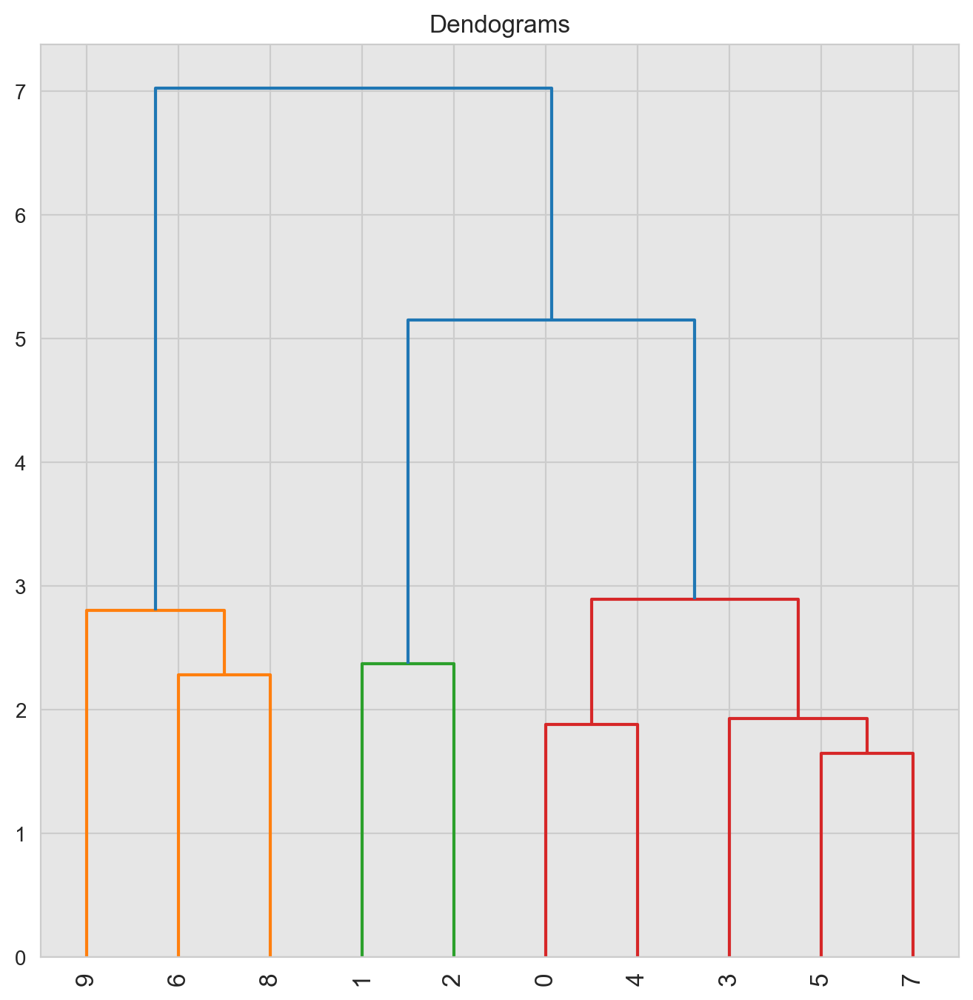

In [93]:
# dendogram
subset = scaled_df.sample(n=10)
plt.figure(figsize=(8,8))
plt.title("Dendograms")
dend = shc.dendrogram(shc.linkage(subset, method='ward'))
plt.xticks(rotation=90)  
plt.show()


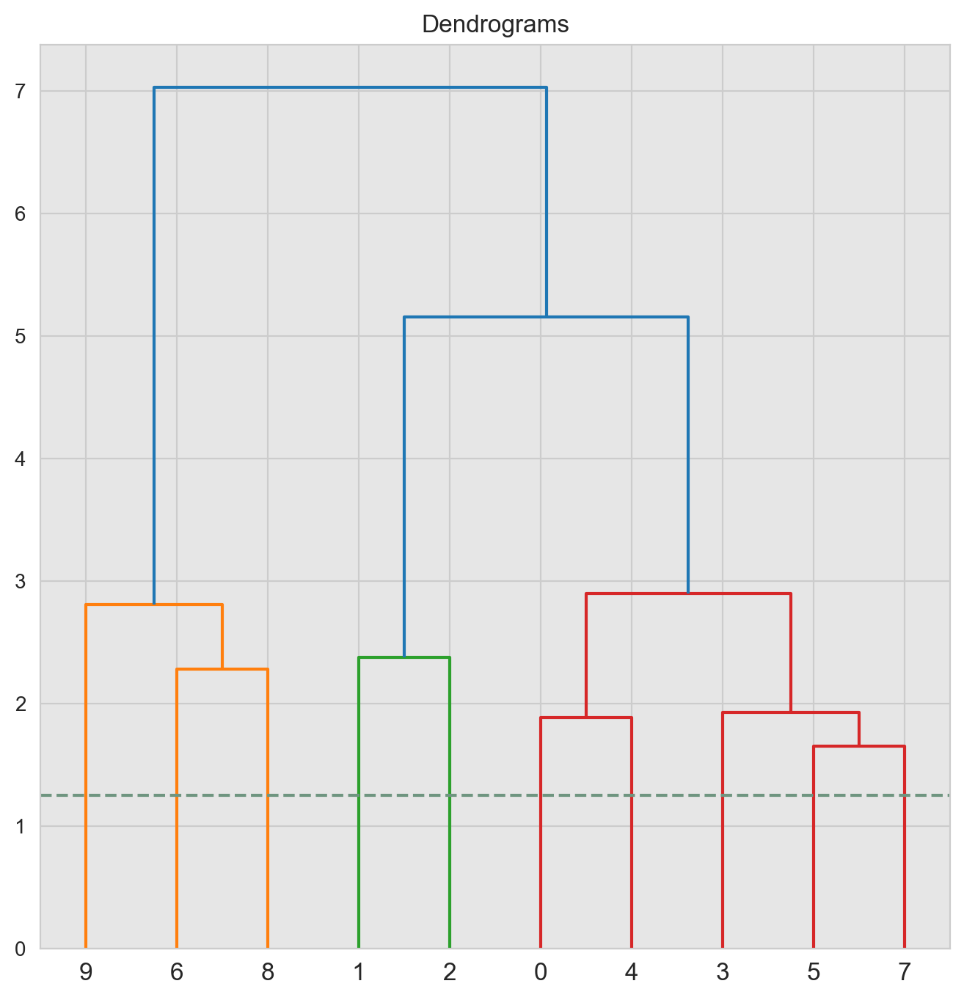

In [97]:
plt.figure(figsize=(8,8))
plt.title('Dendrograms')
dend = shc.dendrogram(shc.linkage(subset, method='ward'))
plt.axhline(y=1.25, color='#6F9580', linestyle='--')

In [99]:
## train model
achc =  AgglomerativeClustering(n_clusters = 3, metric = 'euclidean', linkage= 'ward')
achc.fit_predict(scaled_df)

array([0, 1, 1, 1, 2, 1, 1, 2, 2, 1, 2, 1, 0, 2, 1, 2, 1, 0, 1, 1, 2, 1,
       1, 1, 2, 0, 0, 1, 0, 2, 1, 0, 0, 2, 1, 1, 0, 0, 1, 2, 0, 2, 2, 2,
       2, 1, 1, 1, 1, 1, 0, 2, 1, 2, 2, 1, 0, 1, 2, 0, 2, 1, 1, 0, 0, 1,
       0, 2, 2, 0, 1, 1, 1, 2, 2, 2, 1, 2, 1, 1, 0, 0, 1, 1, 0, 2, 2, 0,
       0, 1, 2, 2, 2, 0, 0, 1, 1, 0, 2, 0, 2, 0, 1, 1, 2, 1, 0, 0, 1, 0,
       2, 2, 0, 0, 2, 1, 0, 1, 1, 1, 1, 2, 2, 1, 1, 1, 0, 1, 1, 0, 2, 1,
       0, 2, 2, 2, 0, 1, 2, 2, 1, 1, 0, 1, 2, 2, 0, 0, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 2, 2, 2, 1, 1, 1, 1, 0, 0])

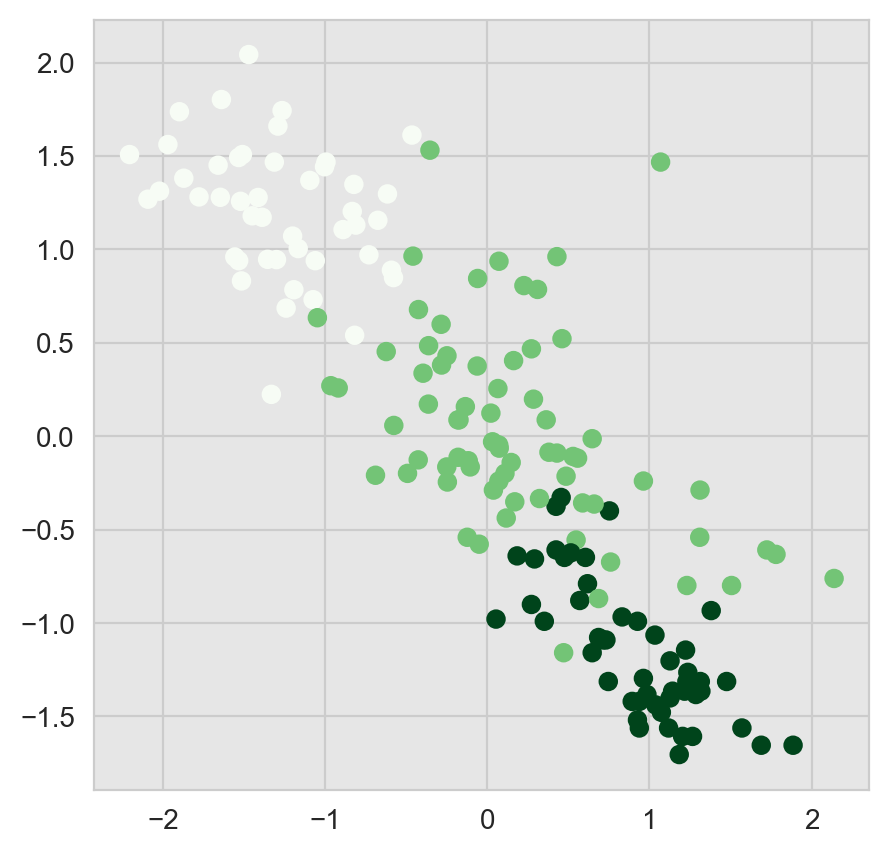

In [101]:
## scatter plot to show the clusters
plt.figure(figsize=(5,5))
plt.scatter(scaled_df['log_income'], scaled_df['log_child_mort'], c=achc.labels_, cmap='Greens')

In [102]:
## adding the clusters to the data 
c_data["HC cluster"] = achc.labels_
c_data

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,...,log_exports,log_health,log_imports,log_income,log_inflation,log_total_fer,log_gdpp,sqrt_lifeexpec,cluster,HC cluster
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,...,1.041393,0.933487,1.661813,3.207096,1.018700,0.833784,2.743510,5.253570,2,0
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,...,1.462398,0.877947,1.695482,3.996993,0.739572,0.423246,3.611829,2.738613,0,1
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,...,1.595496,0.713491,1.510545,4.110623,1.232996,0.589950,3.649432,2.701851,0,1
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,...,1.801404,0.585461,1.642465,3.770926,1.369216,0.854913,3.547898,4.868265,2,1
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,...,1.667453,0.846955,1.777427,4.281056,0.387390,0.495544,4.086395,2.645751,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,...,1.677607,0.795880,1.729974,3.469969,0.558709,0.653213,3.472903,4.560702,0,1
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,...,1.469822,0.771587,1.269513,4.217510,1.671173,0.540329,4.130366,2.898275,0,1
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,...,1.863323,0.894316,1.909556,3.652343,1.117271,0.469822,3.117603,3.271085,0,1
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,...,1.491362,0.790988,1.549003,3.651375,1.390935,0.753583,3.117603,4.037326,2,0


In [103]:
## making it easier to see the data 
hc_clus = c_data.drop(c_data.iloc[:, 10:-1], axis = 1)
hc_clus

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,HC cluster
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,0
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,1
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,1
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,1
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,2
...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,1
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,1
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,1
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,0


In [105]:
## how may of each do we have?
hc_clus["HC cluster"].value_counts()

HC cluster
1    71
2    50
0    46
Name: count, dtype: int64

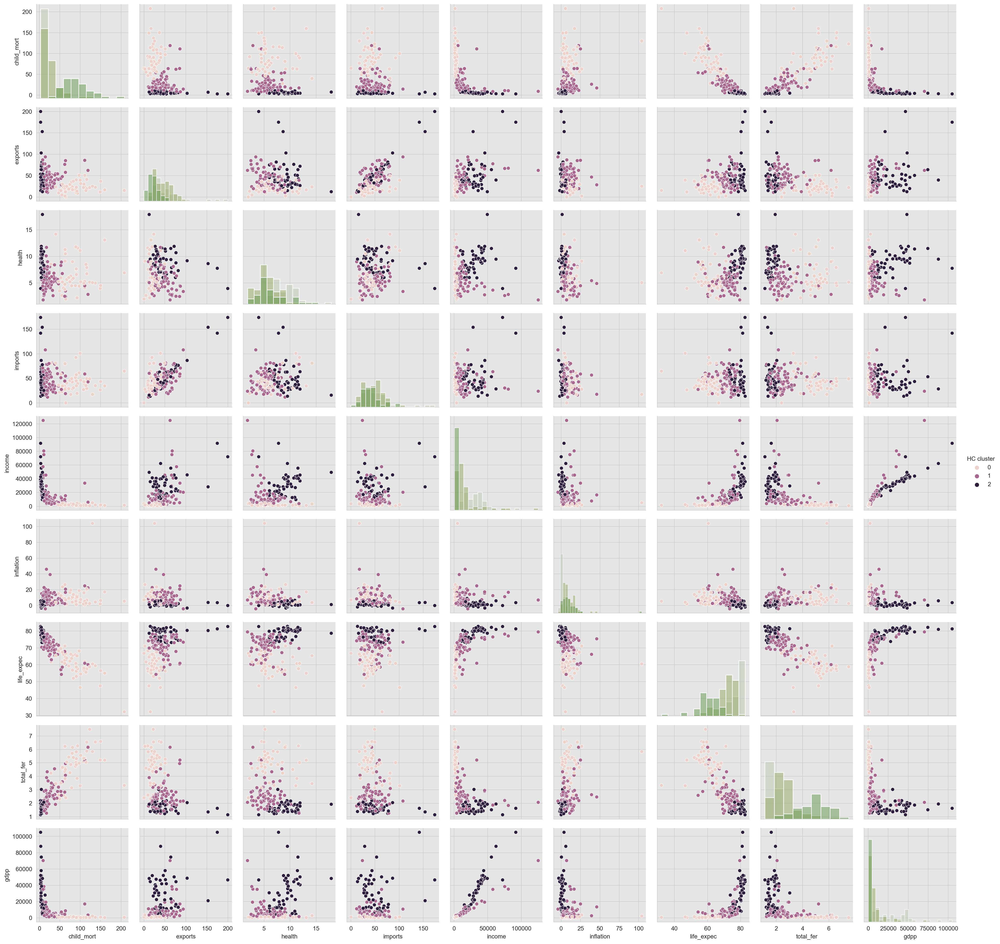

In [106]:
## pair grid 
hc_clust = sns.PairGrid(hc_clus, hue="HC cluster")
hc_clust.map_offdiag(sns.scatterplot, palette=pagr)
hc_clust.map_diag(sns.histplot, palette=pagr)
hc_clust.add_legend()

the countries with the lowest income, gdpp and highest child mortality are the countries in cluster 0 

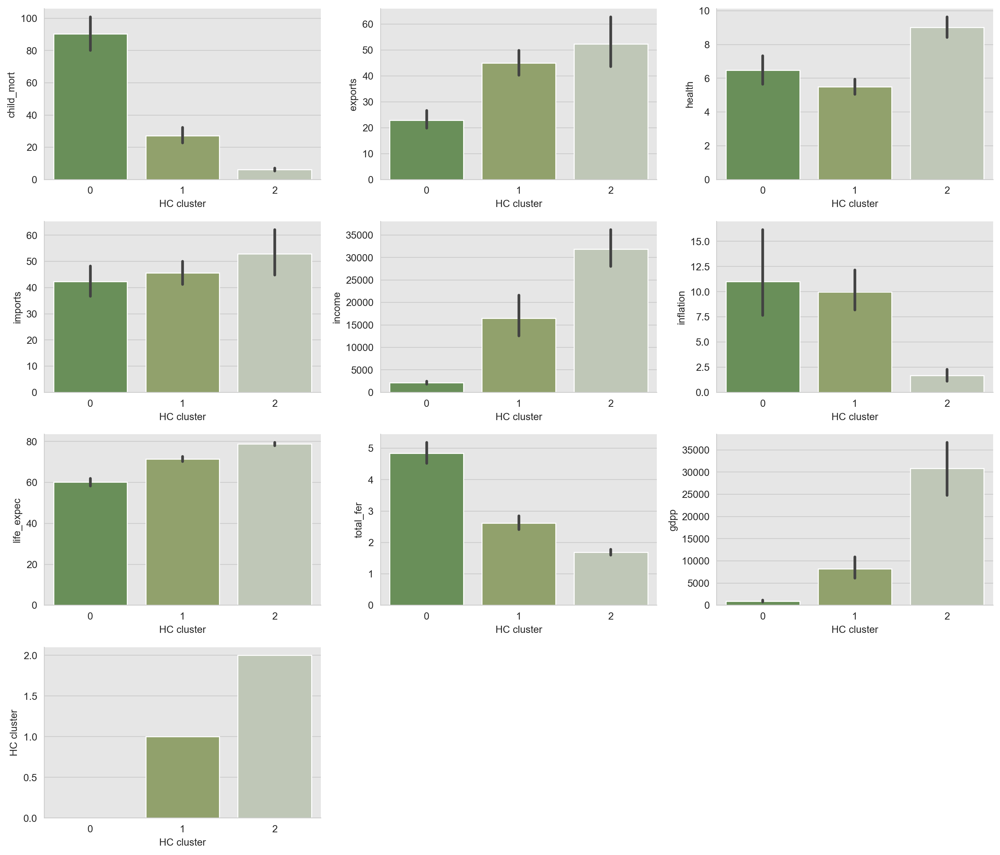

In [110]:
## visualising our clusters and variables
plt.figure(figsize=(14,12))

for x, y in enumerate (hc_clus.describe().columns):
    plt.subplot(4,3, x+1)
    sns.barplot(y=hc_clus[y], x=hc_clus.iloc[:, -1], palette=pagr)
    plt.tight_layout()
    sns.despine()

%config InlineBackend.figure_format='retina'

plt.show()

This is also seen here, the 0 cluster of countries have the lowest total_fer, gdpp, total_fer, highest child mortality

In [111]:
hc_clus2 = hc_clus[hc_clus["HC cluster"]==0]["country"]
hc_clus2

0                   Afghanistan
12                   Bangladesh
17                        Benin
25                 Burkina Faso
26                      Burundi
28                     Cameroon
31     Central African Republic
32                         Chad
36                      Comoros
37             Congo, Dem. Rep.
40                Cote d'Ivoire
50                      Eritrea
56                       Gambia
59                        Ghana
63                       Guinea
64                Guinea-Bissau
66                        Haiti
69                        India
80                        Kenya
81                     Kiribati
84                          Lao
87                      Lesotho
88                      Liberia
93                   Madagascar
94                       Malawi
97                         Mali
99                   Mauritania
101       Micronesia, Fed. Sts.
106                  Mozambique
107                     Myanmar
109                       Nepal
112     

In [128]:
# the cluster 2 countries top 10 countries by lowest gdpp
hc_clus[hc_clus["HC cluster"]==0].sort_values(by=["income"], ascending=True).head(10)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,HC cluster
37,"Congo, Dem. Rep.",116.0,41.10,7.91,49.6,609,20.80,57.5,6.54,334,0
88,Liberia,89.3,19.10,11.80,92.6,700,5.47,60.8,5.02,327,0
26,Burundi,93.6,8.92,11.60,39.2,764,12.30,57.7,6.26,231,0
112,Niger,123.0,22.20,5.16,49.1,814,2.55,58.8,7.49,348,0
31,Central African Republic,149.0,11.80,3.98,26.5,888,2.01,47.5,5.21,446,0
106,Mozambique,101.0,31.50,5.21,46.2,918,7.64,54.5,5.56,419,0
94,Malawi,90.5,22.80,6.59,34.9,1030,12.10,53.1,5.31,459,0
63,Guinea,109.0,30.30,4.93,43.2,1190,16.10,58.0,5.34,648,0
150,Togo,90.3,40.20,7.65,57.3,1210,1.18,58.7,4.87,488,0
132,Sierra Leone,160.0,16.80,13.10,34.5,1220,17.20,55.0,5.20,399,0


In [127]:
hc_clus[hc_clus["HC cluster"]==0].sort_values(by=["income", "life_expec", "gdpp", "child_mort", "imports"], ascending=[True, True, True, False, True]).head(10)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,HC cluster
37,"Congo, Dem. Rep.",116.0,41.10,7.91,49.6,609,20.80,57.5,6.54,334,0
88,Liberia,89.3,19.10,11.80,92.6,700,5.47,60.8,5.02,327,0
26,Burundi,93.6,8.92,11.60,39.2,764,12.30,57.7,6.26,231,0
112,Niger,123.0,22.20,5.16,49.1,814,2.55,58.8,7.49,348,0
31,Central African Republic,149.0,11.80,3.98,26.5,888,2.01,47.5,5.21,446,0
106,Mozambique,101.0,31.50,5.21,46.2,918,7.64,54.5,5.56,419,0
94,Malawi,90.5,22.80,6.59,34.9,1030,12.10,53.1,5.31,459,0
63,Guinea,109.0,30.30,4.93,43.2,1190,16.10,58.0,5.34,648,0
150,Togo,90.3,40.20,7.65,57.3,1210,1.18,58.7,4.87,488,0
132,Sierra Leone,160.0,16.80,13.10,34.5,1220,17.20,55.0,5.20,399,0


The top 5 have remained consistant within both clustering algorithms used. 